<a href="https://colab.research.google.com/github/oakhtar147/wheathead-detection/blob/master/detectron2_wheat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
%automagic 1


Automagic is ON, % prefix IS NOT needed for line magics.


In [1]:
!nvidia-smi

Sun Sep 27 15:32:22 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.66       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P0    30W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [4]:
from IPython.display import Image, clear_output
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
#See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
clear_output()
print("dectectron2 is succesfully installed, please restart runtime before \
importing dependencies")

dectectron2 is succesfully installed, please restart runtime before importing dependencies


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os, json, cv2, random, ast, itertools, shutil, torch, math
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from google.colab.patches import cv2_imshow

#setting matplotlib inline
%matplotlib inline

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader
from detectron2.structures import BoxMode
from detectron2.engine import DefaultPredictor
from detectron2.model_zoo import get_config_file
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.solver import build_lr_scheduler

In [4]:
plt.rcParams["figure.figsize"] = (10, 6)

# Preparing Our Dataset

The two steps we need to follow: 

1.   Register your dataset (i.e., tell detectron2 how to obtain your dataset)
2.   Optionally, register metadata for your dataset.






In [5]:
DATA_PATH = "/content/drive/My Drive/Kaggle/data"
DETECTRON_PATH = "/content/drive/My Drive/detectron2"
IMAGE_WIDTH = IMAGE_HEIGHT = 1024
SEED = 42 # THE ANSWER TO THE WHOLE UNIVERSE

In [6]:
df = pd.read_csv(os.path.join(DATA_PATH, "train.csv"))  # we remove the unwanted cols
df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [7]:
df["bbox"] = df["bbox"].apply(ast.literal_eval)

assert type(df["image_id"][0]) == str
assert type(df["bbox"][0]) == list

The sources of images are: usask_1, arvalis_1, inrae_1, ethz_1, arvalis_3, rres_1, arvalis_2 



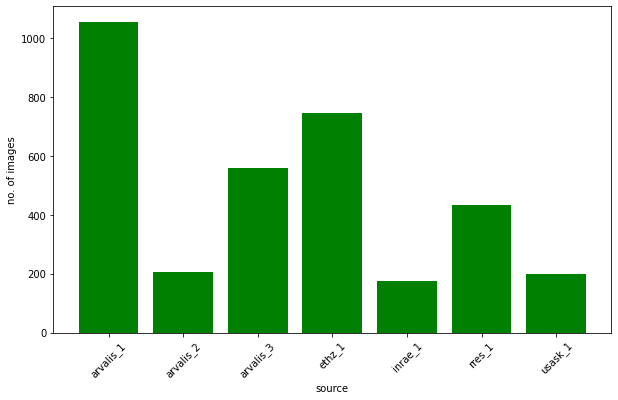

In [8]:
print(f'The sources of images are: {", ".join(df.source.unique())} \n')

sources_dist = df.groupby("source")["image_id"].apply(set).reset_index()
sources_dist["image_per_source"] = sources_dist["image_id"].apply(len)

plt.bar(sources_dist['source'], sources_dist['image_per_source'], color='green')
plt.xticks(rotation=45)
plt.xlabel('source')
plt.ylabel('no. of images')
plt.show()

In [9]:
sources_dist 

,source,image_id,image_per_source
0,arvalis_1,"{76bd18142, 8b41eb776, 9071d1211, 655c1ffdd, 6...",1055
1,arvalis_2,"{b22f456aa, ea89a7320, a673347b1, 030314634, 8...",204
2,arvalis_3,"{9561a71a0, 3bf5b5ee1, b844b0d4f, e755efa77, d...",559
3,ethz_1,"{f27d2e19c, 9458dee84, d94a7f88a, ad67b76a3, b...",747
4,inrae_1,"{f8f466cc9, c2fd0893f, ded3279c6, 0bbcbab79, a...",176
5,rres_1,"{81efcfbdd, 4a44720ca, b61e9bd86, 1734d7a9f, 2...",432
6,usask_1,"{9181010cc, 8b558e9e3, 0a4408b37, 8947f1a02, 4...",200


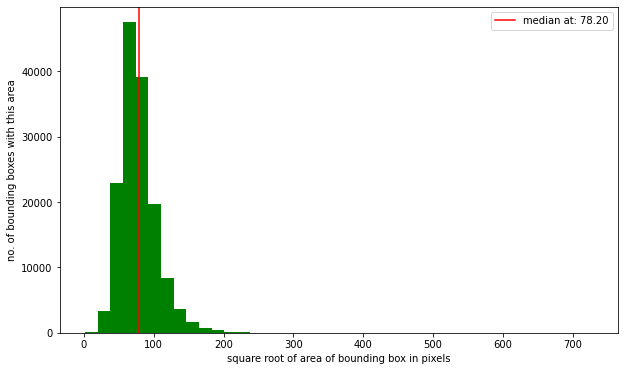

In [10]:
bbox_area = df["bbox_area"] = df["bbox"].apply(lambda b: math.sqrt(b[2] * b[3]))
median_bbox_area = bbox_area.mean()

hist = df["bbox_area"].hist(bins=40, color="green", grid=False)
plt.axvline(median_bbox_area, color="red")
plt.xlabel("square root of area of bounding box in pixels")
plt.ylabel("no. of bounding boxes with this area")
plt.legend([f"median at: {median_bbox_area:.2f}"])
plt.show()

In [11]:
df.head()

,image_id,width,height,bbox,source,bbox_area
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,44.899889
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,86.833173
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,108.811764
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,107.995370
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,120.449159


In [12]:
df = df.groupby("image_id")["bbox"].apply(list).reset_index()
df["bbox_count"] = df["bbox"].apply(len)
df.head()

,image_id,bbox,bbox_count
0,00333207f,"[[0, 654, 37, 111], [0, 817, 135, 98], [0, 192...",55
1,005b0d8bb,"[[765.0, 879.0, 116.0, 79.0], [84.0, 539.0, 15...",20
2,006a994f7,"[[437.0, 988.0, 98.0, 36.0], [309.0, 527.0, 11...",25
3,00764ad5d,"[[89.0, 256.0, 113.0, 107.0], [216.0, 282.0, 1...",41
4,00b5fefed,"[[709.0, 97.0, 204.0, 105.0], [775.0, 250.0, 1...",25


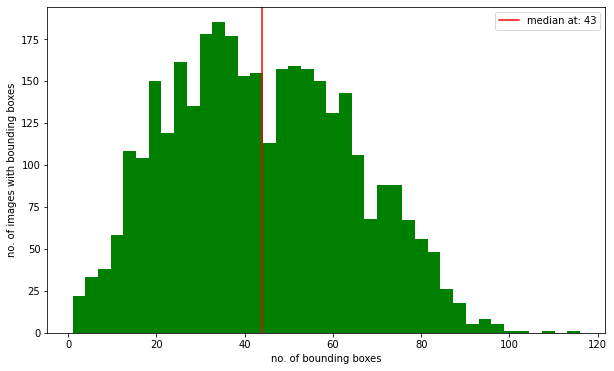

In [13]:
bbox_counts = df["bbox_count"]
median_bbox_counts = bbox_counts.mean()

hist_plot = bbox_counts.hist(bins=40, grid=False, color="g")
plt.axvline(median_bbox_counts, color="red")
plt.xlabel("no. of bounding boxes")
plt.ylabel("no. of images with bounding boxes")
plt.legend([f"median at: {int(median_bbox_counts)}"])
plt.show()

In [14]:
df_train, df_val = train_test_split(df, test_size=0.2,
                                    random_state=SEED,
                                    shuffle=True)

In [15]:
def copy_images(df, data_type):
    for _, row in tqdm(df.iterrows(), total=len(df)):
        src = f"{DATA_PATH}/train/{row.image_id}.jpg"
        dest = f"{DETECTRON_PATH}/wheat_{data_type}/{row.image_id}.jpg"
        shutil.copy(src, dest)

In [16]:
# copy_images(df_train, data_type="train")
# copy_images(df_val, data_type="val")

In [17]:
assert len(os.listdir(os.path.join(DETECTRON_PATH, "wheat_train"))) == len(df_train)
assert len(os.listdir(os.path.join(DETECTRON_PATH, "wheat_val"))) == len(df_val)

In [18]:
def get_dataset_dicts(df, data_type):
    dataset_dicts = []
    for index, row in tqdm(df.iterrows(), total=len(df)):
        data = {
            "file_name": f"{DETECTRON_PATH}/wheat_{data_type}/{row.image_id}.jpg",
            "height": IMAGE_HEIGHT,
            "width": IMAGE_WIDTH,
            "image_id": row.image_id
        }

        annotations = []
        for bbox in row["bbox"]: 
            instance = {
                "bbox": bbox,
                "bbox_mode": BoxMode.XYWH_ABS,
                "category_id": 0,
            }
            annotations.append(instance)

            data["annotations"] = annotations
        dataset_dicts.append(data)  

    return dataset_dicts

In [19]:
for d in ["train", "val"]:
    DatasetCatalog.register(f"wheat_{d}",
                            lambda d=d: get_dataset_dicts(df_train if d=="train" else df_val, data_type=d))
    MetadataCatalog.get(f"wheat_{d}").set(thing_classes=["wheat"])
wheat_metadata = MetadataCatalog.get("wheat_train")    

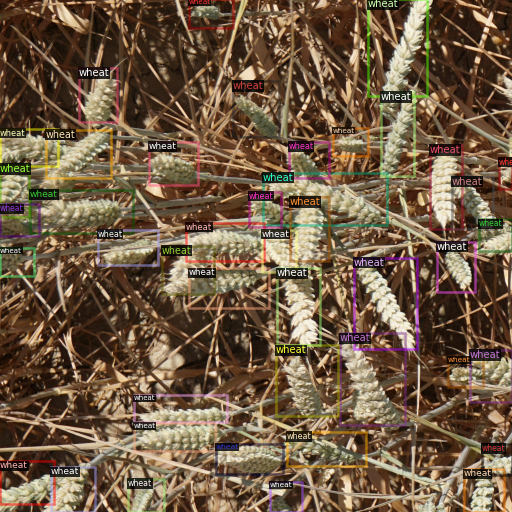

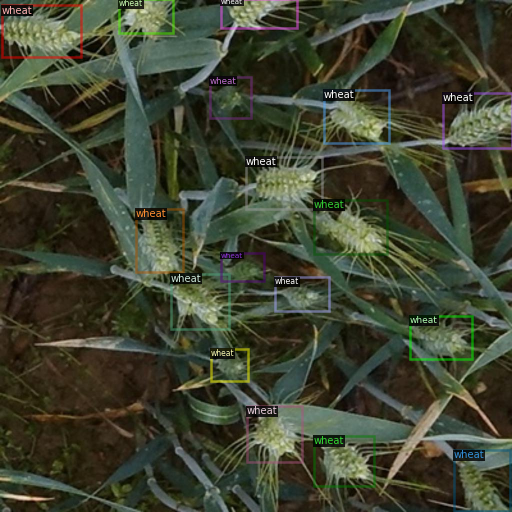

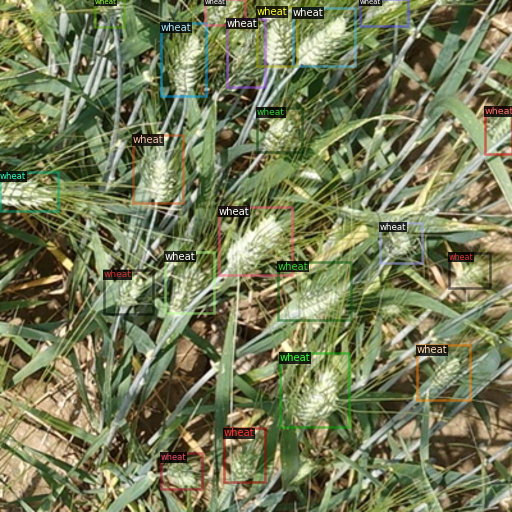

In [20]:
dataset_dicts = get_dataset_dicts(df_train, data_type="train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=wheat_metadata, scale=0.5,
                            instance_mode=1)
    out = visualizer.draw_dataset_dict(d)
    print()
    cv2_imshow(out.get_image()[:, :, ::-1])

In [22]:
cfg = get_cfg()
cfg.merge_from_file(get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("wheat_train",)
cfg.DATASETS.TEST = ("wheat_val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.SOLVER.MAX_ITER = 2500
cfg.SOLVER.BASE_LR = 0.000005
cfg.SOLVER.GAMMA = 0.1
cfg.SOLVER.STEPS = (200, )
cfg.SOLVER.WARMUP_ITERS = 100
cfg.SOLVER.CHECKPOINT_PERIOD = 100
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.OUTPUT_DIR = os.path.join(DETECTRON_PATH, "outputs/train")
cfg.SEED = SEED
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 

In [23]:
os.makedirs(os.path.join(DETECTRON_PATH, "outputs/train"), exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[09/27 15:33:41 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res


[09/27 15:33:42 d2.data.build]: Removed 0 images with no usable annotations. 2698 images left.
[09/27 15:33:42 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   wheat    | 118098       |
|            |              |
[09/27 15:33:42 d2.data.common]: Serializing 2698 elements to byte tensors and concatenating them all ...
[09/27 15:33:42 d2.data.common]: Serialized dataset takes 6.23 MiB
[09/27 15:33:42 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[09/27 15:33:42 d2.data.build]: Using training sampler TrainingSampler
[09/27 15:33:46 d2.engine.train_loop]: Starting training from iteration 2000


/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


[09/27 15:34:02 d2.utils.events]:  eta: 0:05:55  iter: 2019  total_loss: 0.964  loss_cls: 0.301  loss_box_reg: 0.484  loss_rpn_cls: 0.047  loss_rpn_loc: 0.126  time: 0.7403  data_time: 0.0419  lr: 0.000050  max_mem: 4223M
[09/27 15:34:17 d2.utils.events]:  eta: 0:05:43  iter: 2039  total_loss: 1.013  loss_cls: 0.302  loss_box_reg: 0.509  loss_rpn_cls: 0.064  loss_rpn_loc: 0.138  time: 0.7448  data_time: 0.0084  lr: 0.000050  max_mem: 4223M
[09/27 15:34:31 d2.utils.events]:  eta: 0:05:29  iter: 2059  total_loss: 0.996  loss_cls: 0.295  loss_box_reg: 0.509  loss_rpn_cls: 0.050  loss_rpn_loc: 0.124  time: 0.7420  data_time: 0.0068  lr: 0.000050  max_mem: 4223M
[09/27 15:34:46 d2.utils.events]:  eta: 0:05:13  iter: 2079  total_loss: 0.977  loss_cls: 0.299  loss_box_reg: 0.498  loss_rpn_cls: 0.051  loss_rpn_loc: 0.131  time: 0.7364  data_time: 0.0070  lr: 0.000050  max_mem: 4223M
[09/27 15:35:05 d2.utils.events]:  eta: 0:04:57  iter: 2099  total_loss: 1.017  loss_cls: 0.296  loss_box_reg: 0


[09/27 15:40:28 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   wheat    | 29695        |
|            |              |
[09/27 15:40:28 d2.data.common]: Serializing 675 elements to byte tensors and concatenating them all ...
[09/27 15:40:28 d2.data.common]: Serialized dataset takes 1.56 MiB
[09/27 15:40:28 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
WARNING [09/27 15:40:28 d2.engine.defaults]: No evaluator found. Use `DefaultTrainer.test(evaluators=)`, or implement its `build_evaluator` method.
[09/27 15:40:28 d2.utils.events]:  eta: 0:00:00  iter: 2499  total_loss: 1.007  loss_cls: 0.307  loss_box_reg: 0.510  loss_rpn_cls: 0.048  loss_rpn_loc: 0.141  time: 0.7408  data_time: 0.0070  lr: 0.000050  max_mem: 4223M
[09/27 15:40:28 d2.engine.hooks]: Overall training speed: 497 iterations in 0:06:08 (0.7423 s

In [56]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir "/content/drive/My Drive/detectron2/outputs/train"

<IPython.core.display.Javascript object>

In [53]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.IOU_THRESHOLDS = [0.5]
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.4
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1

In [54]:
os.makedirs(os.path.join(DETECTRON_PATH, "outputs/val"), exist_ok=True)
evaluator = COCOEvaluator("wheat_val", cfg, False, 
                          os.path.join(DETECTRON_PATH, "outputs/val"))
val_loader = build_detection_test_loader(cfg, "wheat_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))


[09/27 16:04:14 d2.data.common]: Serializing 675 elements to byte tensors and concatenating them all ...
[09/27 16:04:14 d2.data.common]: Serialized dataset takes 1.56 MiB
[09/27 16:04:14 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/27 16:04:14 d2.evaluation.evaluator]: Start inference on 675 images
[09/27 16:04:16 d2.evaluation.evaluator]: Inference done 11/675. 0.1496 s / img. ETA=0:01:40
[09/27 16:04:21 d2.evaluation.evaluator]: Inference done 44/675. 0.1508 s / img. ETA=0:01:36
[09/27 16:04:26 d2.evaluation.evaluator]: Inference done 77/675. 0.1507 s / img. ETA=0:01:31
[09/27 16:04:31 d2.evaluation.evaluator]: Inference done 110/675. 0.1504 s / img. ETA=0:01:26
[09/27 16:04:36 d2.evaluation.evaluator]: Inference done 143/675. 0.1502 s / img. ETA=0:01:21
[09/27 16:04:41 d2.evaluation.evaluator]: Inference done 176/675. 0.1503 s / img. ETA=0:01:16
[09/27 16:04:46 d2.evaluation.ev

In [51]:
predictor = DefaultPredictor(cfg)


IMAGE: f3c5e09ab


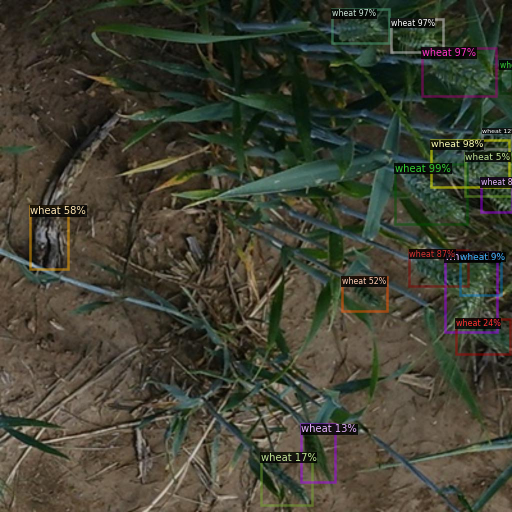

IMAGE: 4a44057d7


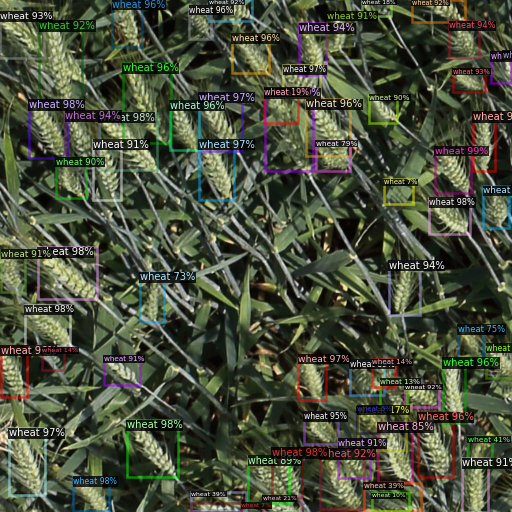

IMAGE: e99cca2a3


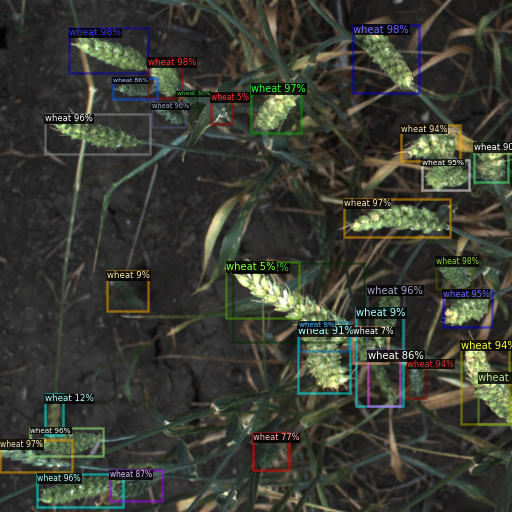

In [55]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_dataset_dicts(df_val, "val")
for d in dataset_dicts[:3]:
    image = d['file_name'].split("/")[-1].strip('.jpg') 
    print(f"IMAGE: {image}")   
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(
        im[:, :, ::-1],
        metadata=wheat_metadata, 
        scale=0.5, 
       )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])